In [2]:
from utils import *
from cnn_gcam import CNN
import pandas as pd

# DenseNet201- Final Model
First, it will be studied wether the model is overfitted or not. Hence, the training and validation evolution of the model will be plotted against the loss and accuracy.

In [3]:
df=pd.read_csv('logs.csv', sep=';')

In [4]:
df.head()

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.436181,2.505782,0.698667,2.221719
1,1,0.696817,2.027565,0.812000,1.717670
2,2,0.755779,1.611660,0.811333,1.345841
3,3,0.802680,1.297798,0.837333,1.071994
4,4,0.821776,1.082587,0.845333,0.892727


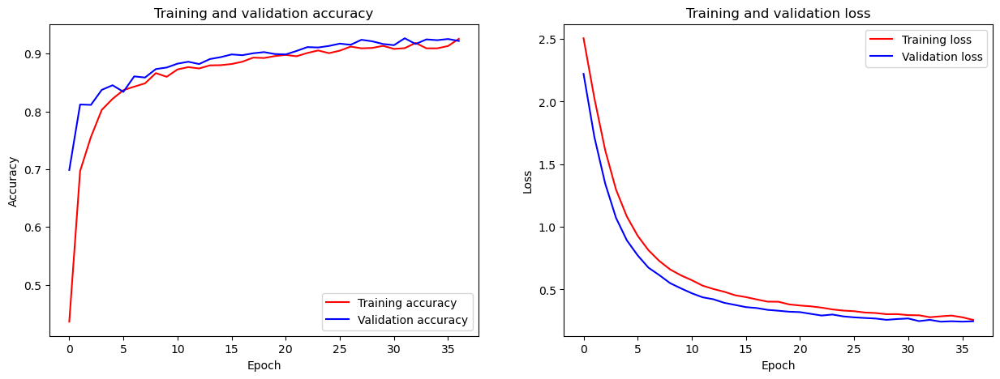

In [5]:
# Accuracy
#Create subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Plot training & validation accuracy values
ax[0].plot(df.epoch, df.accuracy, 'r', label='Training accuracy')
ax[0].plot(df.epoch, df.val_accuracy, 'b', label='Validation accuracy')
ax[0].set_title('Training and validation accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Plot training & validation loss values
ax[1].plot(df.epoch, df.loss, 'r', label='Training loss')
ax[1].plot(df.epoch, df.val_loss, 'b', label='Validation loss')
ax[1].set_title('Training and validation loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.show()


It can be observed that the model is not overfitted. Futhermore, this model was trained with an early stopping criterion that enables to avoid overfitting. If the model worsens more than 3 epochs, then the model stops training and gets the best accuracy epoch.

# Analysis of misclassificated images.
## Creation of the dataset with all misclassified images.
Running all this code and loading the predict_misclassified module allows you to get all misclassified images.

In [11]:
cnn = CNN()
validation_dir = '../dataset/validation'
cnn.load("DenseNet201-def1")
cnn.predict_misclassified(validation_dir, "Validation2")

Reading test data...
Found 1500 images belonging to 15 classes.
1500/1500 [==============================] - 43s 25ms/step


A csv file will be created with all images. An explanation will be showed:
* Filename. This is the path to the image.
* True Label. This is the true label of the image.
* Predicted Label(Top 1). Prediction of the model.
* Correct. A boolean to show wether the model has predicted correctly or not.
* Top 2. The second best prediction of the model.
* Top 3. The third best prediction of the model.

In [12]:
df2=pd.read_csv('Validation2.csv', sep=',')

In [13]:
df2.head()

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
0,Bedroom\image_0001.jpg,Bedroom,Bedroom,True,Living room,Kitchen
1,Bedroom\image_0002.jpg,Bedroom,Bedroom,True,Living room,Kitchen
2,Bedroom\image_0005.jpg,Bedroom,Bedroom,True,Living room,Kitchen
3,Bedroom\image_0009.jpg,Bedroom,Bedroom,True,Living room,Kitchen
4,Bedroom\image_0010.jpg,Bedroom,Bedroom,True,Kitchen,Living room


## Creation of the confusion matrix for validation dataset.
This matrix shows all predictions.

In [14]:
validation_dir = '../dataset/validation'
cnn.predict(validation_dir, "Validation2")

Reading test data...
Found 1500 images belonging to 15 classes.
1500/1500 [==============================] - 39s 26ms/step


CLASSIFICATION RESULTS (VALIDATION2)

Confusion matrix

KNOWN/PREDICTED  Bedroom  Coast  Forest  Highway  Industrial  Inside city  Kitchen  Living room  Mountain  Office  Open country  Store  Street  Suburb  Tall building
Bedroom             85.0    0.0     0.0      0.0         0.0          0.0      3.0         11.0       0.0     0.0           0.0    1.0     0.0     0.0            0.0
Coast                0.0   93.0     0.0      0.0         0.0          0.0      0.0          0.0       1.0     0.0           6.0    0.0     0.0     0.0            0.0
Forest               0.0    0.0    95.0      0.0         0.0          0.0      0.0          0.0       1.0     0.0           4.0    0.0     0.0     0.0            0.0
Highway              0.0    0.0     0.0     98.0         0.0          0.0      0.0          0.0       0.0     0.0           1.0    0.0     1.0     0.0     

## Identification all misclassified images.

## Bedroom

In [15]:
df2[(df2["True Label"]=="Bedroom") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
7,Bedroom\image_0022.jpg,Bedroom,Living room,False,Bedroom,Kitchen
8,Bedroom\image_0023.jpg,Bedroom,Kitchen,False,Kitchen,Living room
9,Bedroom\image_0025.jpg,Bedroom,Living room,False,Kitchen,Bedroom
10,Bedroom\image_0027.jpg,Bedroom,Living room,False,Kitchen,Store
11,Bedroom\image_0028.jpg,Bedroom,Living room,False,Bedroom,Kitchen
14,Bedroom\image_0036.jpg,Bedroom,Store,False,Store,Living room
29,Bedroom\image_0075.jpg,Bedroom,Living room,False,Bedroom,Kitchen
56,Bedroom\image_0133.jpg,Bedroom,Living room,False,Bedroom,Kitchen
64,Bedroom\image_0149.jpg,Bedroom,Living room,False,Bedroom,Kitchen
65,Bedroom\image_0151.jpg,Bedroom,Living room,False,Bedroom,Office


## Coast

In [16]:
df2[(df2["True Label"]=="Coast") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
101,Coast\image_0010.jpg,Coast,Open country,False,Mountain,Coast
118,Coast\image_0098.jpg,Coast,Open country,False,Coast,Highway
124,Coast\image_0116.jpg,Coast,Open country,False,Coast,Mountain
127,Coast\image_0123.jpg,Coast,Open country,False,Mountain,Coast
146,Coast\image_0200.jpg,Coast,Open country,False,Coast,Highway
164,Coast\image_0251.jpg,Coast,Mountain,False,Coast,Open country
187,Coast\image_0320.jpg,Coast,Open country,False,Forest,Coast


## Forest

In [17]:
df2[(df2["True Label"]=="Forest") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
225,Forest\image_0087.jpg,Forest,Open country,False,Forest,Street
246,Forest\image_0156.jpg,Forest,Open country,False,Forest,Mountain
249,Forest\image_0172.jpg,Forest,Open country,False,Forest,Mountain
283,Forest\image_0279.jpg,Forest,Open country,False,Open country,Mountain
291,Forest\image_0300.jpg,Forest,Mountain,False,Mountain,Open country


## Highway

In [18]:
df2[(df2["True Label"]=="Highway") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
385,Highway\image_0219.jpg,Highway,Street,False,Street,Tall building
394,Highway\image_0242.jpg,Highway,Open country,False,Highway,Coast


## Industrial

In [19]:
df2[(df2["True Label"]=="Industrial") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
407,Industrial\image_0018.jpg,Industrial,Highway,False,Street,Store
412,Industrial\image_0033.jpg,Industrial,Inside city,False,Industrial,Tall building
475,Industrial\image_0239.jpg,Industrial,Store,False,Store,Kitchen
476,Industrial\image_0249.jpg,Industrial,Inside city,False,Tall building,Industrial
495,Industrial\image_0301.jpg,Industrial,Tall building,False,Industrial,Street


## Inside city

In [20]:
df2[(df2["True Label"]=="Inside city") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
504,Inside city\image_0026.jpg,Inside city,Industrial,False,Inside city,Tall building
524,Inside city\image_0090.jpg,Inside city,Street,False,Street,Highway
555,Inside city\image_0174.jpg,Inside city,Street,False,Street,Store
557,Inside city\image_0180.jpg,Inside city,Street,False,Inside city,Industrial
558,Inside city\image_0181.jpg,Inside city,Highway,False,Highway,Street
585,Inside city\image_0261.jpg,Inside city,Industrial,False,Highway,Inside city
589,Inside city\image_0274.jpg,Inside city,Industrial,False,Highway,Inside city
591,Inside city\image_0279.jpg,Inside city,Tall building,False,Inside city,Industrial
592,Inside city\image_0281.jpg,Inside city,Industrial,False,Industrial,Street
593,Inside city\image_0290.jpg,Inside city,Street,False,Inside city,Store


## Kitchen

In [21]:
df2[(df2["True Label"]=="Kitchen") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
632,Kitchen\image_0076.jpg,Kitchen,Inside city,False,Industrial,Kitchen
648,Kitchen\image_0103.jpg,Kitchen,Living room,False,Kitchen,Office
652,Kitchen\image_0109.jpg,Kitchen,Living room,False,Bedroom,Kitchen
656,Kitchen\image_0126.jpg,Kitchen,Industrial,False,Kitchen,Store
666,Kitchen\image_0145.jpg,Kitchen,Inside city,False,Kitchen,Industrial
671,Kitchen\image_0153.jpg,Kitchen,Store,False,Living room,Kitchen
672,Kitchen\image_0155.jpg,Kitchen,Living room,False,Bedroom,Kitchen
675,Kitchen\image_0161.jpg,Kitchen,Store,False,Kitchen,Living room
684,Kitchen\image_0179.jpg,Kitchen,Living room,False,Kitchen,Bedroom
686,Kitchen\image_0185.jpg,Kitchen,Living room,False,Kitchen,Bedroom


## Living room

In [22]:
df2[(df2["True Label"]=="Living room") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
704,Living room\image_0016.jpg,Living room,Industrial,False,Living room,Store
707,Living room\image_0019.jpg,Living room,Bedroom,False,Living room,Kitchen
711,Living room\image_0030.jpg,Living room,Bedroom,False,Living room,Kitchen
722,Living room\image_0054.jpg,Living room,Bedroom,False,Living room,Kitchen
739,Living room\image_0125.jpg,Living room,Bedroom,False,Living room,Kitchen
743,Living room\image_0133.jpg,Living room,Bedroom,False,Living room,Industrial
754,Living room\image_0164.jpg,Living room,Bedroom,False,Living room,Kitchen
756,Living room\image_0168.jpg,Living room,Bedroom,False,Living room,Kitchen
762,Living room\image_0188.jpg,Living room,Bedroom,False,Living room,Office
765,Living room\image_0193.jpg,Living room,Bedroom,False,Living room,Office


## Mountain

In [23]:
df2[(df2["True Label"]=="Mountain") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
810,Mountain\image_0057.jpg,Mountain,Open country,False,Open country,Highway
827,Mountain\image_0136.jpg,Mountain,Open country,False,Open country,Highway
847,Mountain\image_0199.jpg,Mountain,Open country,False,Mountain,Highway
864,Mountain\image_0267.jpg,Mountain,Open country,False,Mountain,Coast


## Office

In [24]:
df2[(df2["True Label"]=="Office") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
905,Office\image_0017.jpg,Office,Inside city,False,Store,Office
952,Office\image_0122.jpg,Office,Kitchen,False,Office,Store
953,Office\image_0125.jpg,Office,Kitchen,False,Office,Bedroom
963,Office\image_0149.jpg,Office,Living room,False,Office,Bedroom
965,Office\image_0152.jpg,Office,Living room,False,Bedroom,Office
967,Office\image_0154.jpg,Office,Living room,False,Bedroom,Office
977,Office\image_0171.jpg,Office,Store,False,Store,Office
978,Office\image_0172.jpg,Office,Kitchen,False,Kitchen,Living room
999,Office\image_0215.jpg,Office,Living room,False,Office,Bedroom


## Open Country

In [25]:
df2[(df2["True Label"]=="Open country") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
1004,Open country\image_0048.jpg,Open country,Highway,False,Open country,Street
1012,Open country\image_0075.jpg,Open country,Coast,False,Open country,Highway
1013,Open country\image_0078.jpg,Open country,Coast,False,Open country,Highway
1019,Open country\image_0094.jpg,Open country,Mountain,False,Open country,Forest
1033,Open country\image_0156.jpg,Open country,Mountain,False,Open country,Coast
1059,Open country\image_0241.jpg,Open country,Mountain,False,Mountain,Forest
1086,Open country\image_0342.jpg,Open country,Industrial,False,Open country,Coast
1091,Open country\image_0366.jpg,Open country,Highway,False,Open country,Coast
1098,Open country\image_0398.jpg,Open country,Coast,False,Open country,Mountain


## Store

In [26]:
df2[(df2["True Label"]=="Store") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
1106,Store\image_0019.jpg,Store,Kitchen,False,Store,Industrial
1113,Store\image_0054.jpg,Store,Inside city,False,Inside city,Kitchen
1133,Store\image_0108.jpg,Store,Living room,False,Store,Kitchen
1141,Store\image_0130.jpg,Store,Inside city,False,Inside city,Kitchen
1168,Store\image_0205.jpg,Store,Street,False,Store,Industrial
1171,Store\image_0219.jpg,Store,Kitchen,False,Living room,Store
1179,Store\image_0244.jpg,Store,Office,False,Store,Kitchen


## Street

In [27]:
df2[(df2["True Label"]=="Street") & (df2["Correct"]==False)]

,Filename,True Label,Predicted Label (Top 1),Correct,Top 2,Top 3
1204,Street\image_0005.jpg,Street,Inside city,False,Street,Industrial
1215,Street\image_0037.jpg,Street,Inside city,False,Street,Industrial
1224,Street\image_0067.jpg,Street,Inside city,False,Street,Store
1297,Street\image_0276.jpg,Street,Inside city,False,Street,Industrial


In [30]:
from keras.models import load_model

In [32]:
model=load_model("DenseNet201-def1.h5")

## Misclassified images code

This function creates a directory called Unclassified_images and saves all the unclassified images.

Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)


c:\Users\victor\Desktop\MBD\Machine Learning 2\3. Deep learning\lab\cnn_def\utils\utils.py:80: RuntimeWarning: invalid value encountered in divide
  heatmap = (cam - cam.min()) / (cam.max() - cam.min())


Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)


c:\Users\victor\Desktop\MBD\Machine Learning 2\3. Deep learning\lab\cnn_def\utils\utils.py:94: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(20, 10))


Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction shape: (1, 15)
Prediction s

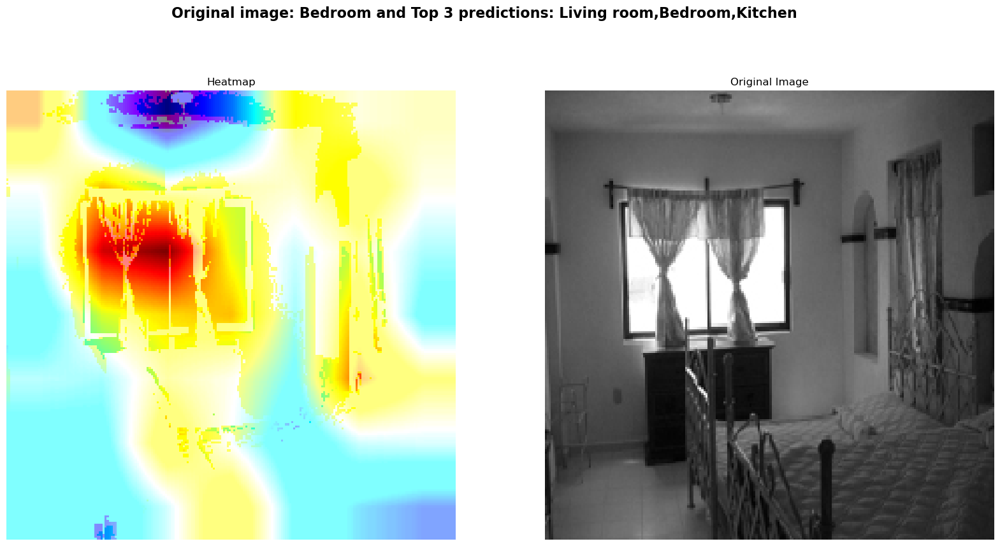

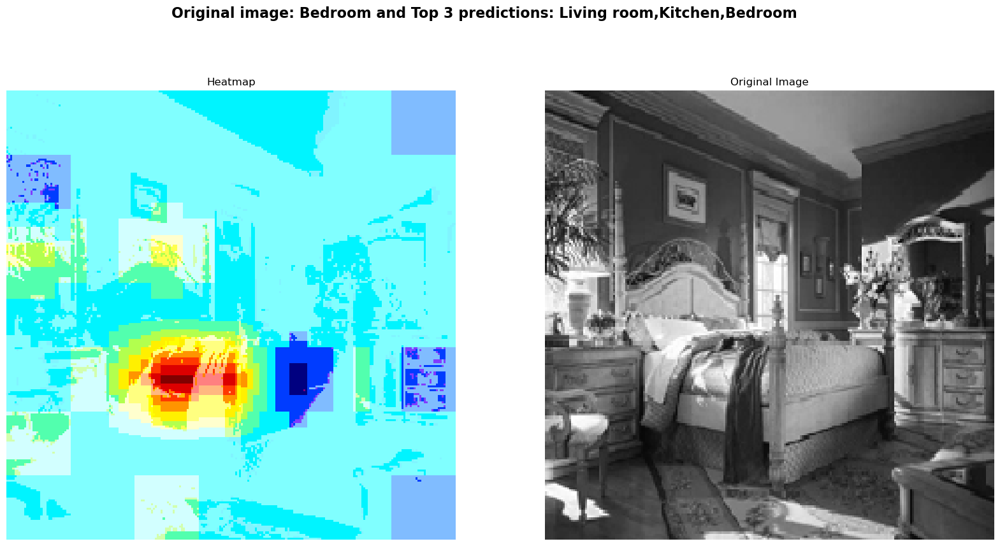

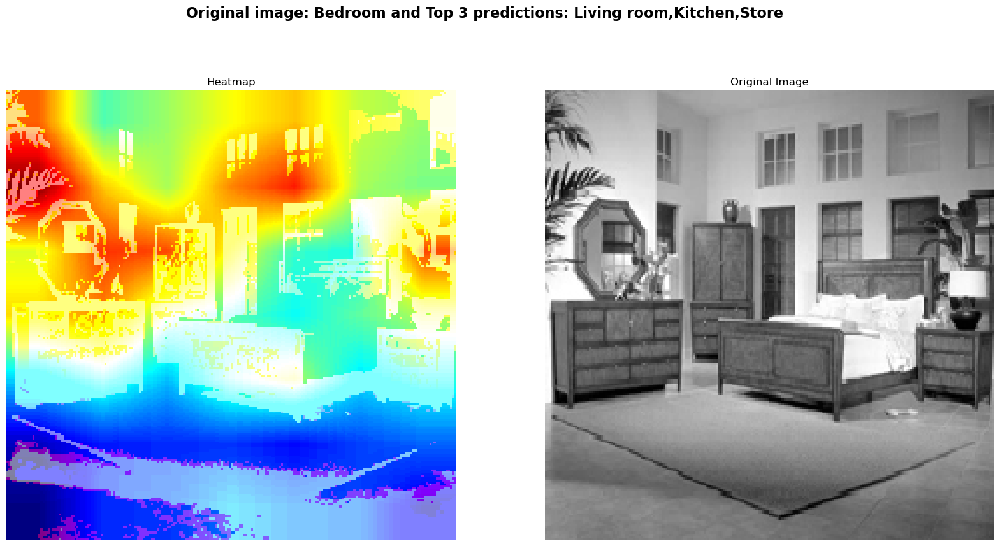

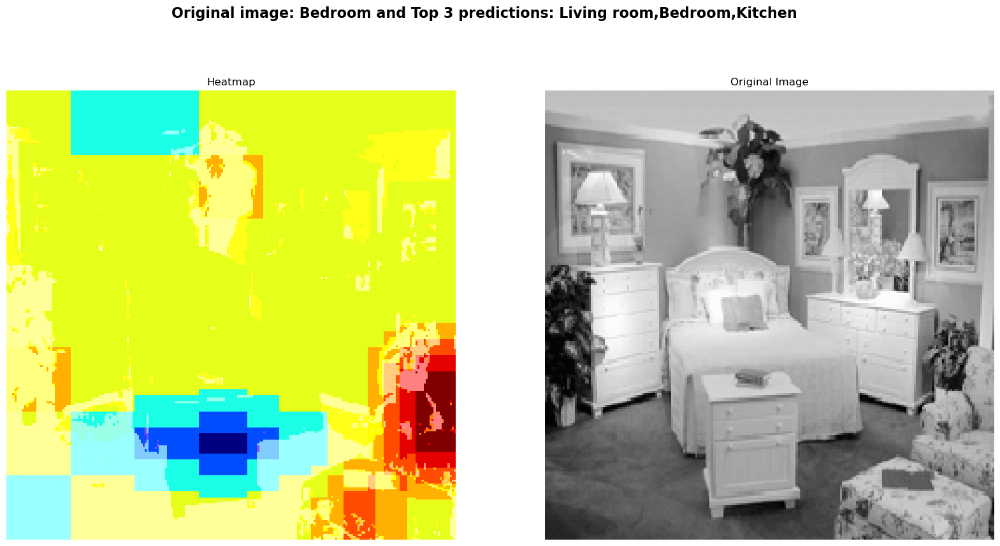

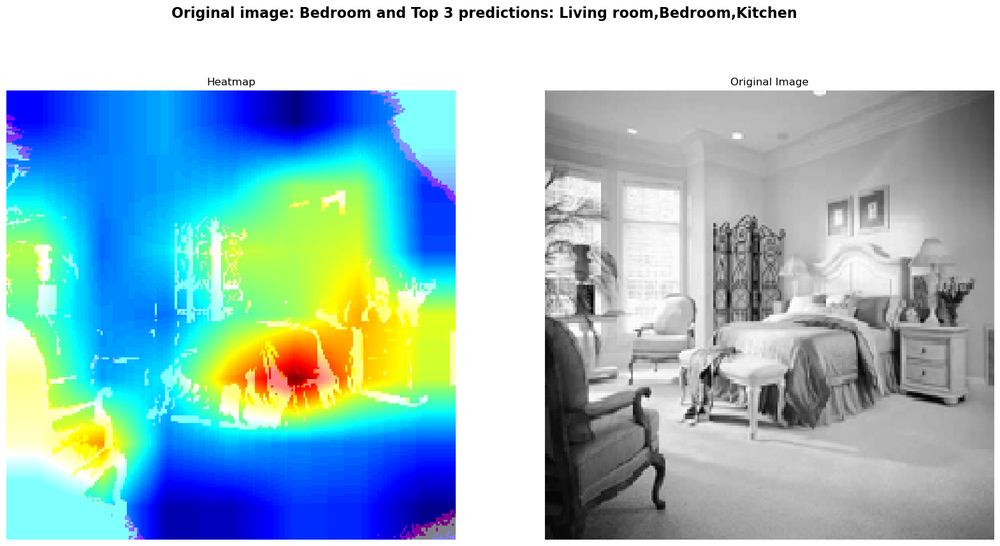

...

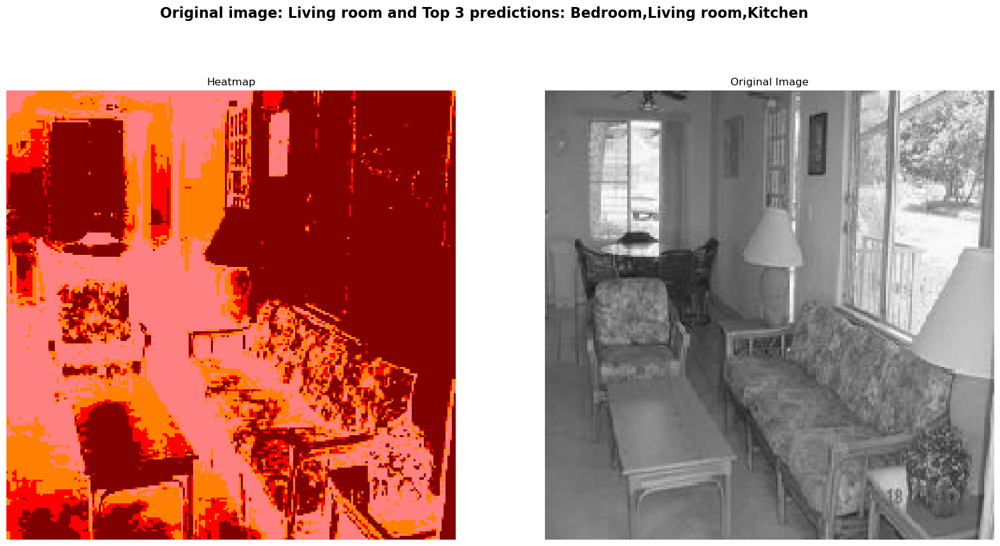

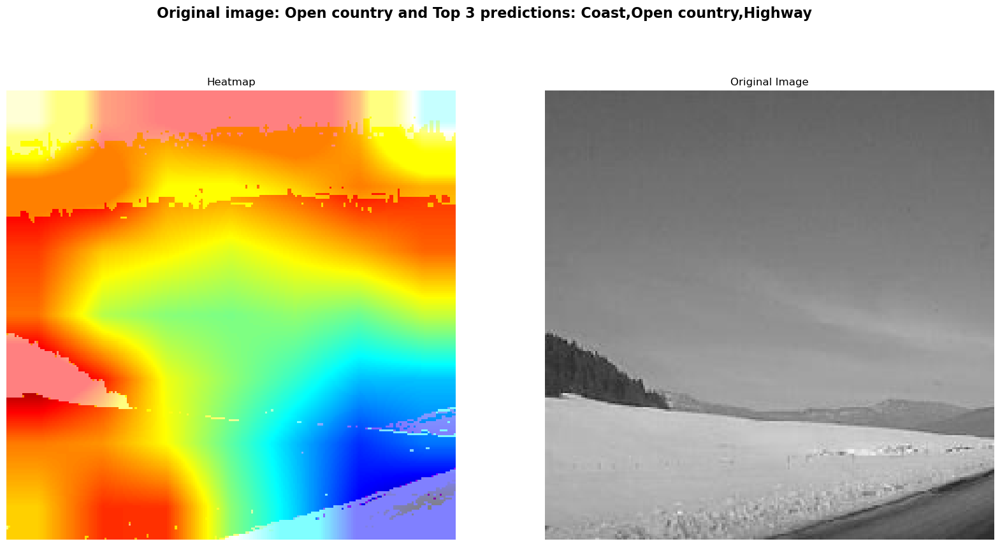

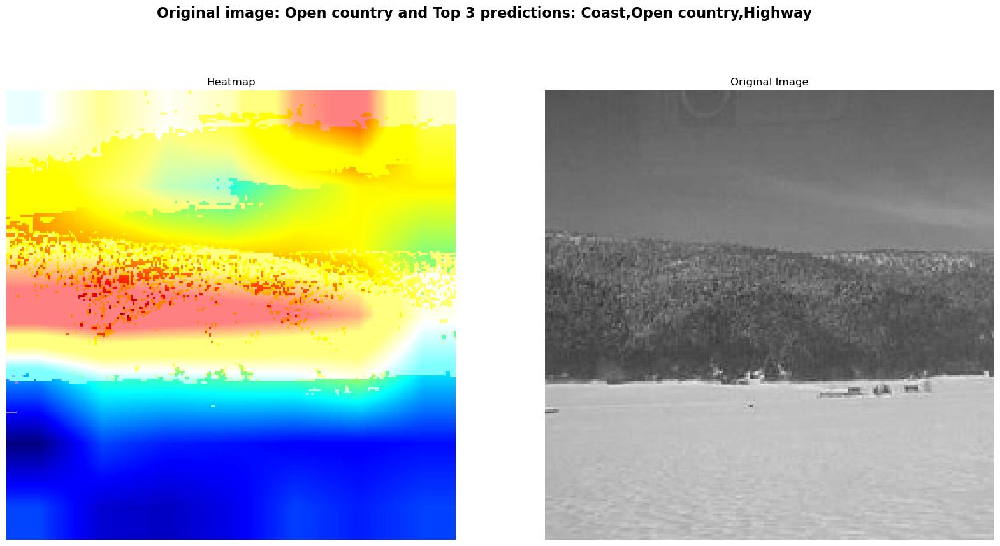

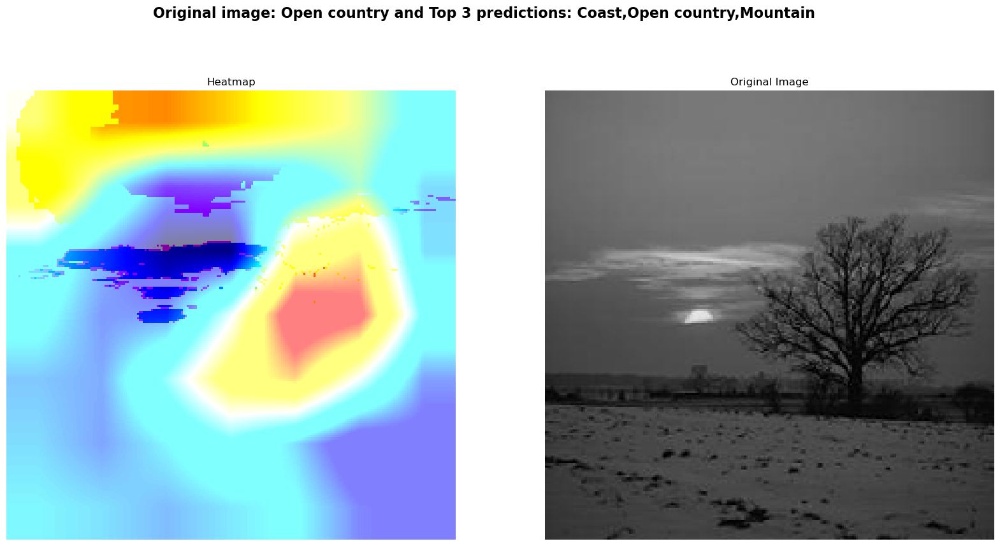

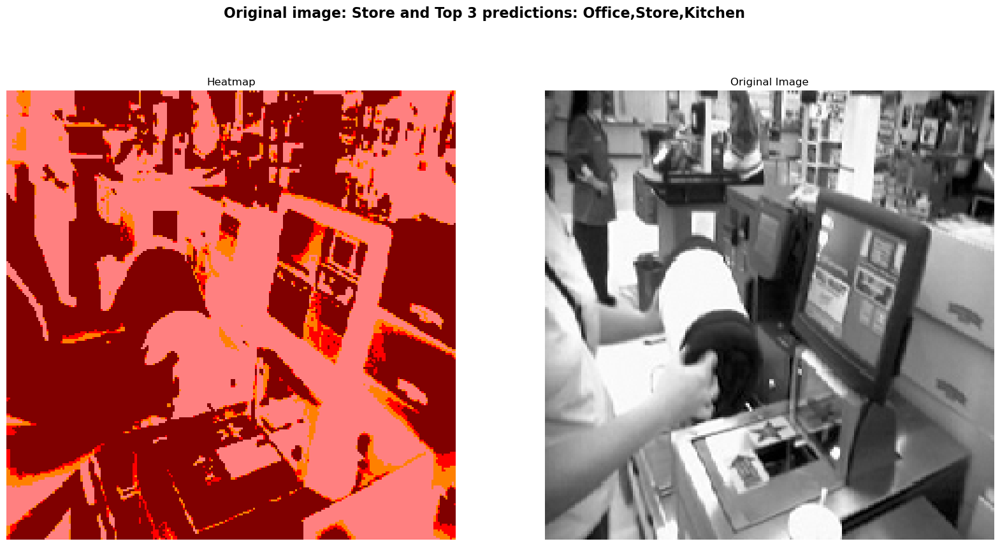

In [33]:
analysis_misclassified(model, df2)

Prediction shape: (1, 15)
1/1 [==============================] - 0s 22ms/step


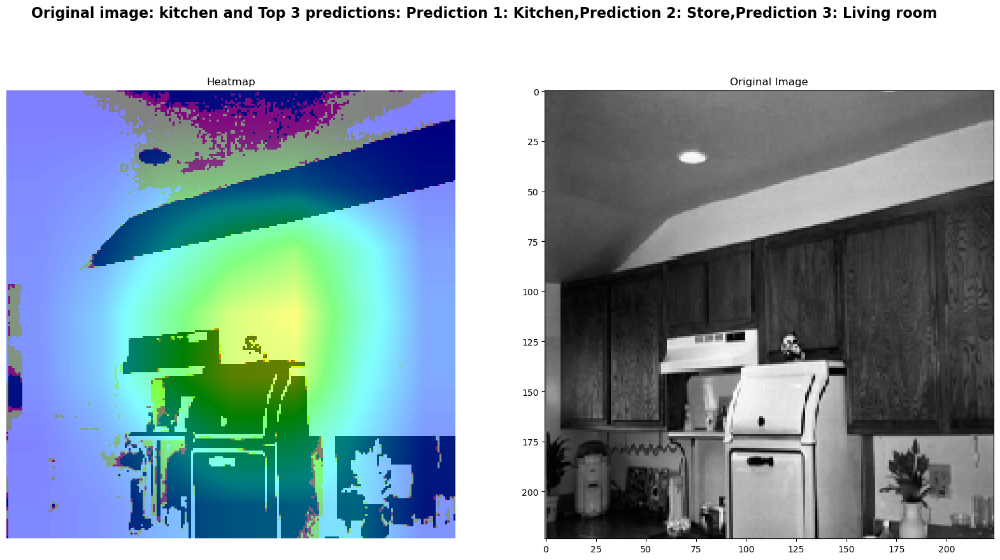

In [ ]:
img_size = (224, 224)
img_path = '../dataset/validation/kitchen\image_0206.jpg'
preprocess_input = keras.applications.xception.preprocess_input
img_array = preprocess_input(get_img_array(img_path, size=img_size))

make_gradcam_heatmap(img_array, model, "conv5_block3_out", img_path,cosa=0)